# ДЗ №3: Sampling в латентном пространстве StyleGAN
### Пухкало Влада

## Зависимости и скачивание данных

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
!pip install ninja
!pip install imageio-ffmpeg
!pip install lpips
!pip install pytorch_msssim
!pip install pytorch-ignite

# Создаем директорию для сырых изображений
%mkdir raw_images

# Клонируем репозиторий StyleGAN2-ADA-PyTorch
!git clone https://github.com/NVlabs/stylegan2-ada-pytorch
%cd stylegan2-ada-pytorch

# Клонируем репозиторий с моделями StyleGAN2
!git clone https://github.com/denkogit/stylegan2_models

# Создаем директорию для предобученных моделей и переходим в нее
!mkdir pretrained_models
%cd pretrained_models

# Скачиваем предобученную модель FFHQ
!wget https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl

# Скачиваем и разархивируем файл shape_predictor_68_face_landmarks.dat
!wget https://github.com/davisking/dlib-models/raw/master/shape_predictor_68_face_landmarks.dat.bz2
!bzip2 -d /content/stylegan2-ada-pytorch/pretrained_models/shape_predictor_68_face_landmarks.dat.bz2

# Скачиваем файл e4e_ffhq_encode.pt напрямую
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1cUv_reLE6k3604or78EranS7XzuVMWeO' -O e4e_ffhq_encode.pt

# Возвращаемся в корневую директорию проекта
%cd ..

In [ ]:
# Устанавливаем gdown для скачивания файлов из Google Drive
!pip install gdown

# Задаем идентификаторы файлов
celebs_file_id = '1WoiQmg7k-XKYSVNMvAZm_QUqAo_gK5uE'
editing_file_id = '10zYE9lkYq6SuMVL0MaTv4YSuwdg_Wbhg'

# Скачиваем файлы с использованием gdown
!gdown --id $celebs_file_id -O /content/celebs.zip
!gdown --id $editing_file_id -O /content/editing.zip

# Распаковываем архивы
!unzip /content/celebs.zip -d /content/
!unzip /content/editing.zip -d /content/
!rm -rf /content/__MACOSX

In [ ]:
import PIL
import os
import numpy as np
import torch
import lpips
import torch.nn as nn
import torchvision.transforms as transforms
from pytorch_msssim import ms_ssim
from tqdm import tqdm
import torch.nn.functional as F
import pickle
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

## Подготовка данных и проекции в латентное пространство

In [ ]:
#Align images

import os
from stylegan2_models.image_aligner.face_alignment import image_align
from stylegan2_models.image_aligner.landmarks_detector import LandmarksDetector


landmarks_model_path = "/content/stylegan2-ada-pytorch/pretrained_models/shape_predictor_68_face_landmarks.dat"
RAW_IMAGES_DIR = "/content/celebs"
ALIGNED_IMAGES_DIR = "/content/aligned_images"

landmarks_detector = LandmarksDetector(landmarks_model_path)
for celeb in os.listdir(RAW_IMAGES_DIR):
  celeb_folder = os.path.join(RAW_IMAGES_DIR, celeb)
  save_path = os.path.join(ALIGNED_IMAGES_DIR, celeb)
  os.makedirs(save_path, exist_ok=True)
  for i, img_name in enumerate(os.listdir(celeb_folder)):
      if img_name == ".ipynb_checkpoints":
        continue
      raw_img_path = os.path.join(celeb_folder, img_name)
      for face_landmarks in landmarks_detector.get_landmarks(raw_img_path):
          aligned_face_path = os.path.join(save_path, f"{i}.jpg")
          image_align(raw_img_path, aligned_face_path, face_landmarks)
          break

In [ ]:
!python3 generate.py --outdir=out --trunc=0.0 --network=pretrained_models/ffhq.pkl --seeds=123

In [ ]:
def plot_image(tensor, plot_size=(10,10)):
  tensor = (tensor.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  img = Image.fromarray(tensor[0].cpu().numpy(), 'RGB')
  plt.rcParams["figure.figsize"] = plot_size
  plt.imshow(img)


def broadcast_w_sg(w_batch, cast_n=18):
    input_ws = []
    for w in w_batch:
        w_broadcast = torch.broadcast_to(w, (cast_n, 512))
        input_ws.append(w_broadcast)
    return torch.stack(input_ws)

In [ ]:
seed = 2345645
noise_mode = 'const' # шум
label = 0 # для разных моделей
device = "cuda:0"
model_path = "/content/stylegan2-ada-pytorch/pretrained_models/ffhq.pkl"

with open(model_path, 'rb') as f:
    G = pickle.load(f)['G_ema'].cuda()

In [ ]:
!python3 projector.py --outdir=out --num-steps=300 --target=/content/aligned_images/LDCaprio/0.jpg --network=pretrained_models/ffhq.pkl

In [ ]:
!rm -r out

Напишем функцию для подбора проекции к изображению, добавив в нее шедулер с шагом 50:

In [ ]:
class Rec_loss(nn.Module):
    def __init__(self):
        super().__init__()
        self.l1_criterion = torch.nn.L1Loss(reduction='mean')

    def forward(self, target, synth):
        target = torch.add(target, 1.0)
        target = torch.mul(target, 127.5)
        target = target / 255

        synth = torch.add(synth, 1.0)
        synth = torch.mul(synth, 127.5)
        synth = synth / 255

        loss = torch.mean(1 - ms_ssim(synth, target, data_range=1, size_average=True))
        return loss

class Lpips_loss(nn.Module):
    def __init__(self, device):
        super().__init__()
        self.lpips_loss = lpips.LPIPS(net='vgg')
        self.lpips_loss.to(device)
        self.lpips_loss.eval()

    def forward(self, target, synth):
        return torch.mean(self.lpips_loss(target, synth))

class Reg_loss(nn.Module):
    def __init__(self, noise_bufs):
        super().__init__()
        self.noise_bufs = noise_bufs

    def forward(self,):
        reg_loss = 0.0
        for v in self.noise_bufs.values():
            noise = v[None,None,:,:] # must be [1,1,H,W] for F.avg_pool2d()
            while True:
                reg_loss += (noise*torch.roll(noise, shifts=1, dims=3)).mean()**2
                reg_loss += (noise*torch.roll(noise, shifts=1, dims=2)).mean()**2
                if noise.shape[2] <= 8:
                    break
                noise = F.avg_pool2d(noise, kernel_size=2)
        return reg_loss

def image2tensor_norm(image):
    transform = transforms.Compose([transforms.ToTensor(),
                                   transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    tensor = transform(image)
    return tensor

def get_latent_projection(image_path, G, device, num_steps=150, initial_learning_rate=0.05, w_avg_samples=10000,
                          regularize_noise_weight=5e5, rec_weight=0.5, lpips_weight=1):
    # Загружаем изображение
    target_pil = PIL.Image.open(image_path).convert('RGB')
    target_tensor = image2tensor_norm(target_pil).to(device).unsqueeze(0)

    # Инициализируем функции потерь
    lpips_loss = Lpips_loss(device)
    rec_loss = Rec_loss()
    noise_bufs = {name: buf for (name, buf) in G.synthesis.named_buffers() if 'noise_const' in name}
    reg_loss = Reg_loss(noise_bufs)

    seed = 42

    # Получаем средний вектор латентного пространства
    z_samples = torch.from_numpy(np.random.RandomState(seed).randn(w_avg_samples, G.z_dim)).to(device)
    w_samples = G.mapping(z_samples, None)
    w_samples = w_samples[:, :1, :].cpu().numpy().astype(np.float32)
    w_avg = np.mean(w_samples, axis=0, keepdims=True)   # [1, 1, C]
    w_std = (np.sum((w_samples - w_avg) ** 2) / w_avg_samples) ** 0.5

    # w or w_plus
    w_opt = torch.tensor(w_avg, dtype=torch.float32, device=device, requires_grad=False)  # pylint: disable=not-callable
    w_opt = broadcast_w_sg(w_opt).requires_grad_(True)

    optimizer = torch.optim.Adam([w_opt], lr=initial_learning_rate)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=50, gamma=0.1)  # Reduce LR every 50 steps

    for step in tqdm(range(num_steps)):
        synth_tensor = G.synthesis(broadcast_w_sg(w_opt), noise_mode='const')

        lpips_value = lpips_loss(synth_tensor, target_tensor)
        rec_value = rec_loss(synth_tensor, target_tensor)
        reg_value = reg_loss()

        loss = lpips_value * lpips_weight + rec_value * rec_weight + reg_value * regularize_noise_weight

        optimizer.zero_grad(set_to_none=True)
        loss.backward()
        optimizer.step()
        scheduler.step()

    generated_tensor = G.synthesis(broadcast_w_sg(w_opt), noise_mode='const', force_fp32=True)

    return loss.item(), generated_tensor

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:07<00:00, 77.4MB/s]


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth
Setting up PyTorch plugin "bias_act_plugin"... 

/usr/local/lib/python3.10/dist-packages/torch/utils/cpp_extension.py:1967: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(


Done.


  0%|          | 0/150 [00:00<?, ?it/s]

Setting up PyTorch plugin "upfirdn2d_plugin"... 

/usr/local/lib/python3.10/dist-packages/torch/utils/cpp_extension.py:1967: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(


Done.


100%|██████████| 150/150 [01:37<00:00,  1.53it/s]


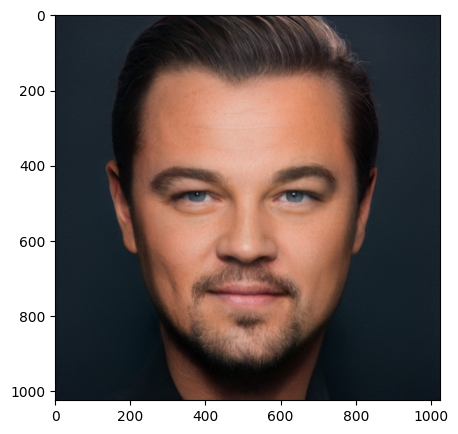

In [ ]:
image_path = '/content/aligned_images/LDCaprio/0.jpg'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
_, latent_projection = get_latent_projection(image_path, G, device)
plot_image(latent_projection, plot_size=(5,5))

Теперь подберем гиперпараметры с помощью случайного поиска по сетке:

In [ ]:
import itertools
import random

def random_grid_search(image_path, G, device, param_grid, n_iter=20):
    best_loss = float('inf')
    best_params = None
    best_generated_tensor = None

    # Перебираем случайные комбинации параметров
    param_keys = list(param_grid.keys())
    for _ in range(n_iter):
        params = {key: random.choice(values) for key, values in param_grid.items()}
        print(f"Testing parameters: {params}")

        loss, generated_tensor = get_latent_projection(
            image_path,
            G,
            device,
            num_steps=params['num_steps'],
            initial_learning_rate=params['initial_learning_rate'],
            regularize_noise_weight=params['regularize_noise_weight'],
            rec_weight=params['rec_weight'],
            lpips_weight=params['lpips_weight']
        )

        print(f"Loss: {loss}")

        if loss < best_loss:
            best_loss = loss
            best_params = params
            best_generated_tensor = generated_tensor

    return best_params, best_loss, best_generated_tensor

In [ ]:
# param_grid = {
#     'num_steps': [100, 150, 200],
#     'initial_learning_rate': [0.05, 0.1, 0.2],
#     'regularize_noise_weight': [1e5, 5e5, 1e6],
#     'rec_weight': [0.3, 0.5, 0.7],
#     'lpips_weight': [0.7, 1, 1.3]
# }

# image_path = '/content/aligned_images/LDCaprio/0.jpg'

# best_params, best_loss, best_generated_tensor = random_grid_search(image_path, G, device, param_grid, n_iter=5)

# print(f"Best parameters: {best_params}")
# print(f"Best loss: {best_loss}")
# plot_image(best_generated_tensor)

Теперь таким способом составляем таблицу для всех изображений

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

person_folders = [f.path for f in os.scandir('/content/aligned_images') if f.is_dir()]

def process_image_for_person(person_folder, G, device, param_grid, n_iter=20):
    image_path = os.path.join(person_folder, sorted(os.listdir(person_folder))[0])

    best_params, best_loss, best_generated_tensor = random_grid_search(image_path, G, device, param_grid, n_iter = 10)

    original_image = Image.open(image_path).convert('RGB')

    return original_image, best_generated_tensor, best_params

param_grid = {
    'num_steps': [100, 150, 200],
    'initial_learning_rate': [0.05, 0.1, 0.2],
    'regularize_noise_weight': [1e5, 5e5, 1e6],
    'rec_weight': [0.3, 0.5, 0.7],
    'lpips_weight': [0.7, 1, 1.3]
}

results = []

# Обработка всех папок
for person_folder in person_folders:
    print(f"Processing {person_folder}...")
    original_image, generated_tensor, best_params = process_image_for_person(person_folder, G, device, param_grid)

    generated_image = plot_image(generated_tensor, plot_size=(5,5))

    results.append({
        'Original Image': original_image,
        'Generated Tensor':generated_tensor,
        'Generated Image': generated_image,
        'Best Params': best_params
    })


Best Params: {'num_steps': 150, 'initial_learning_rate': 0.05, 'regularize_noise_weight': 500000.0, 'rec_weight': 0.5, 'lpips_weight': 1}


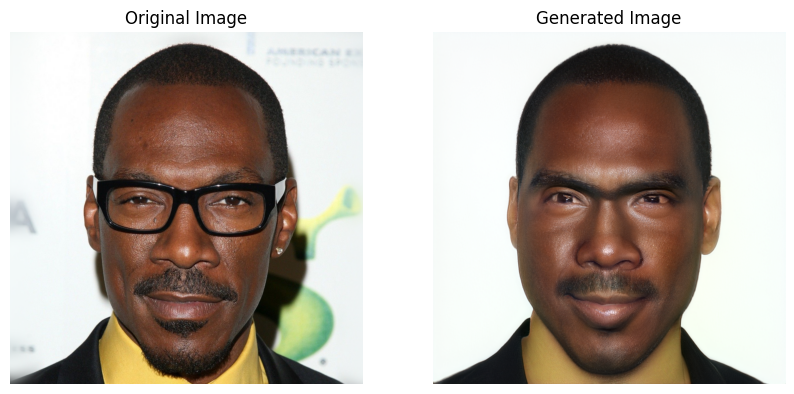



Best Params: {'num_steps': 150, 'initial_learning_rate': 0.05, 'regularize_noise_weight': 500000.0, 'rec_weight': 0.5, 'lpips_weight': 1}


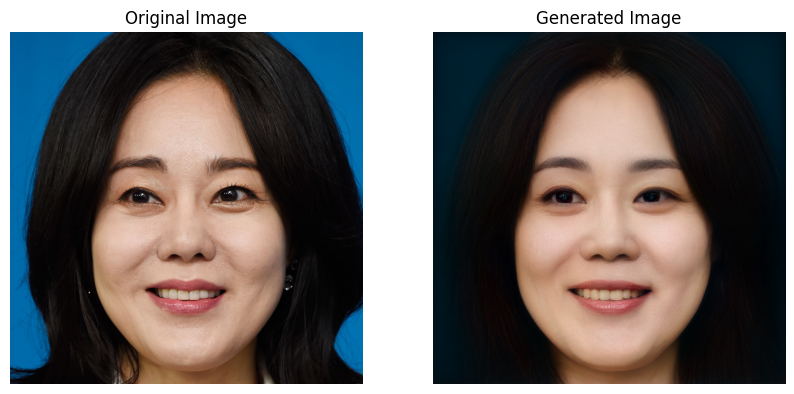



Best Params: {'num_steps': 150, 'initial_learning_rate': 0.05, 'regularize_noise_weight': 500000.0, 'rec_weight': 0.5, 'lpips_weight': 1}


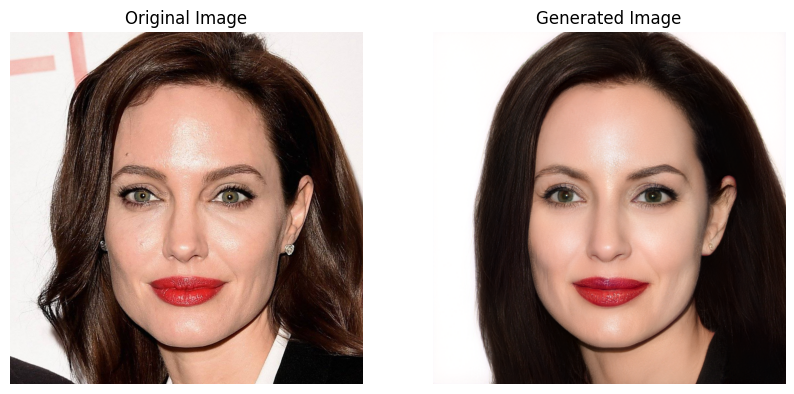



Best Params: {'num_steps': 150, 'initial_learning_rate': 0.05, 'regularize_noise_weight': 500000.0, 'rec_weight': 0.5, 'lpips_weight': 1}


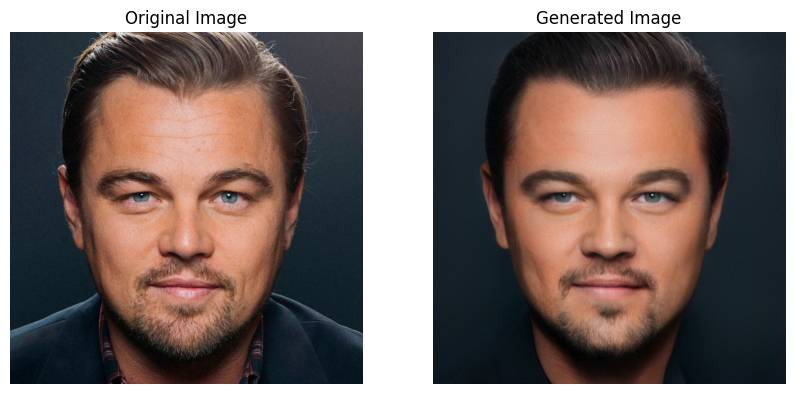



Best Params: {'num_steps': 150, 'initial_learning_rate': 0.05, 'regularize_noise_weight': 500000.0, 'rec_weight': 0.5, 'lpips_weight': 1}


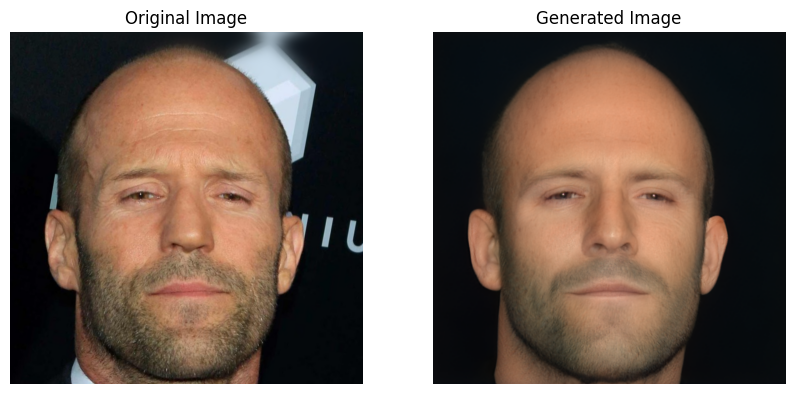

In [ ]:
# Создание таблицы результатов
df = pd.DataFrame(results)

def display_images(row):
    tensor = row['Generated Tensor']
    tensor = (tensor.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    gen_img = Image.fromarray(tensor[0].cpu().numpy(), 'RGB')
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(row['Original Image'])
    axes[0].axis('off')
    axes[0].set_title('Original Image')

    axes[1].imshow(gen_img)
    axes[1].axis('off')
    axes[1].set_title('Generated Image')
    plt.show()

for idx, row in df.iterrows():
    print(f"Best Params: {row['Best Params']}")
    display_images(row)
    print("\n")

## Style transfer

In [ ]:
!pip install --upgrade --no-cache-dir gdown

In [ ]:
!gdown --id 1cUv_reLE6k3604or78EranS7XzuVMWeO -O /content/stylegan2-ada-pytorch/pretrained_models/e4e_ffhq_encode.pt


In [ ]:
from stylegan2_models.e4e.model_utils import load_e4e_standalone
import torchvision.transforms as transforms

e4e_model, _ = load_e4e_standalone("/content/stylegan2-ada-pytorch/pretrained_models/e4e_ffhq_encode.pt")

image2e4etensor = transforms.Compose([transforms.ToTensor(),
                                transforms.Resize((256, 256)),
                                transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])

In [ ]:
image_path = "/content/aligned_images/LDCaprio/0.jpg"
target_pil = Image.open(image_path).convert('RGB')
target_uint8 = np.array(target_pil, dtype=np.uint8)

e4e_tensor = image2e4etensor(target_uint8).to(device).unsqueeze(0)
initial_latent_vector = e4e_model(e4e_tensor)
print(initial_latent_vector.size())

torch.Size([1, 18, 512])


In [ ]:
generated_tensor = G.synthesis(initial_latent_vector, noise_mode='const', force_fp32=True)
plot_image(generated_tensor, (5,5))

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"
%rm -rf /content/e4e_invertion

In [ ]:
# функция для проекции изображения в скрытое пространство

import os
import glob
import pandas as pd
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

def project_and_save_image(image_path):
    save_path = image_path.replace("/content/aligned_images", "/content/e4e_invertion").replace(".jpg", ".pt")
    save_dir = os.path.dirname(save_path)

    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    target_pil = Image.open(image_path).convert('RGB')
    target_uint8 = np.array(target_pil, dtype=np.uint8)
    e4e_tensor = image2e4etensor(target_uint8).to(device).unsqueeze(0)

    latent_vector = e4e_model(e4e_tensor).detach().cpu()

    torch.save(latent_vector, save_path)
    return save_path

image_path = "/content/aligned_images/LDCaprio/0.jpg"
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
project_and_save_image(image_path)

'/content/e4e_invertion/LDCaprio/0.pt'

In [ ]:
# интерполяция

def interpolate(latent1, latent2, psi=0.5, indeces=[i for i in range(0,18)]):
    init_latent = latent1.clone()
    latent1 = latent1.clone()
    latent2 = latent2.clone()
    for i in indeces:
        latent1[:, i] = latent2[:, i].lerp(latent1[:, i], psi)

    edited_tensor = G.synthesis(latent1, noise_mode='const', force_fp32=True)
    init_tensor = G.synthesis(init_latent, noise_mode='const', force_fp32=True)
    style_tensor = G.synthesis(latent2, noise_mode='const', force_fp32=True)
    plot_image(torch.cat((init_tensor, style_tensor, edited_tensor ), dim=3), (10,10))
    return edited_tensor

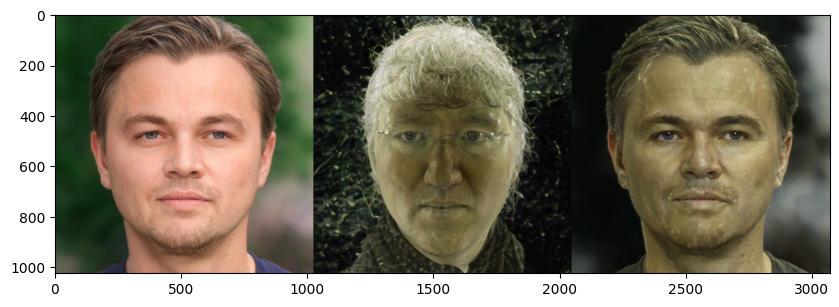

In [ ]:
picture = "/content/aligned_images/LDCaprio/0.jpg"
# style = "/content/editing/red_face.jpg"
# style = "/content/editing/scetch.jpg"
style = "/content/editing/fairy_face.jpg"
change_indeces = [9,10,11,12,13,14,15,16,17]

latent1=torch.load(project_and_save_image(picture)).to(device)
latent2=torch.load(project_and_save_image(style)).to(device)
latent2 = broadcast_w_sg(latent2)

interpolate(latent1, latent2, psi=0.1, indeces=change_indeces)
print()

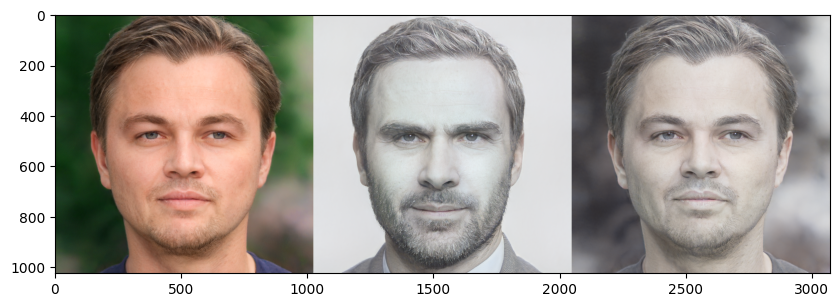

In [ ]:
picture = "/content/aligned_images/LDCaprio/0.jpg"
# style = "/content/editing/red_face.jpg"
style = "/content/editing/scetch.jpg"
# style = "/content/editing/fairy_face.jpg"
change_indeces = [9,10,11,12,13,14,15,16,17]

latent1=torch.load(project_and_save_image(picture)).to(device)
latent2=torch.load(project_and_save_image(style)).to(device)
latent2 = broadcast_w_sg(latent2)

interpolate(latent1, latent2, psi=0.1, indeces=change_indeces)
print()

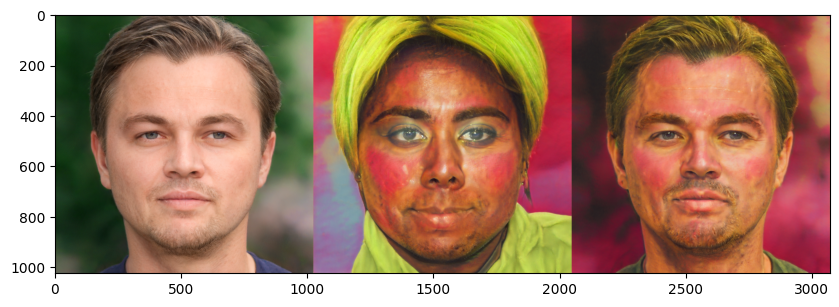

In [ ]:
picture = "/content/aligned_images/LDCaprio/0.jpg"
style = "/content/editing/red_face.jpg"
# style = "/content/editing/scetch.jpg"
# style = "/content/editing/fairy_face.jpg"
change_indeces = [9,10,11,12,13,14,15,16,17]

latent1=torch.load(project_and_save_image(picture)).to(device)
latent2=torch.load(project_and_save_image(style)).to(device)
latent2 = broadcast_w_sg(latent2)

interpolate(latent1, latent2, psi=0.1, indeces=change_indeces)
print()

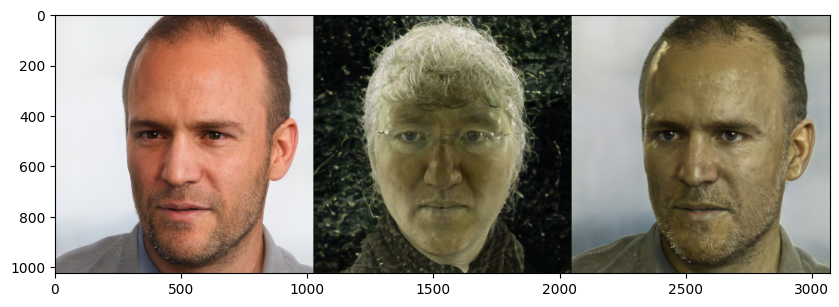

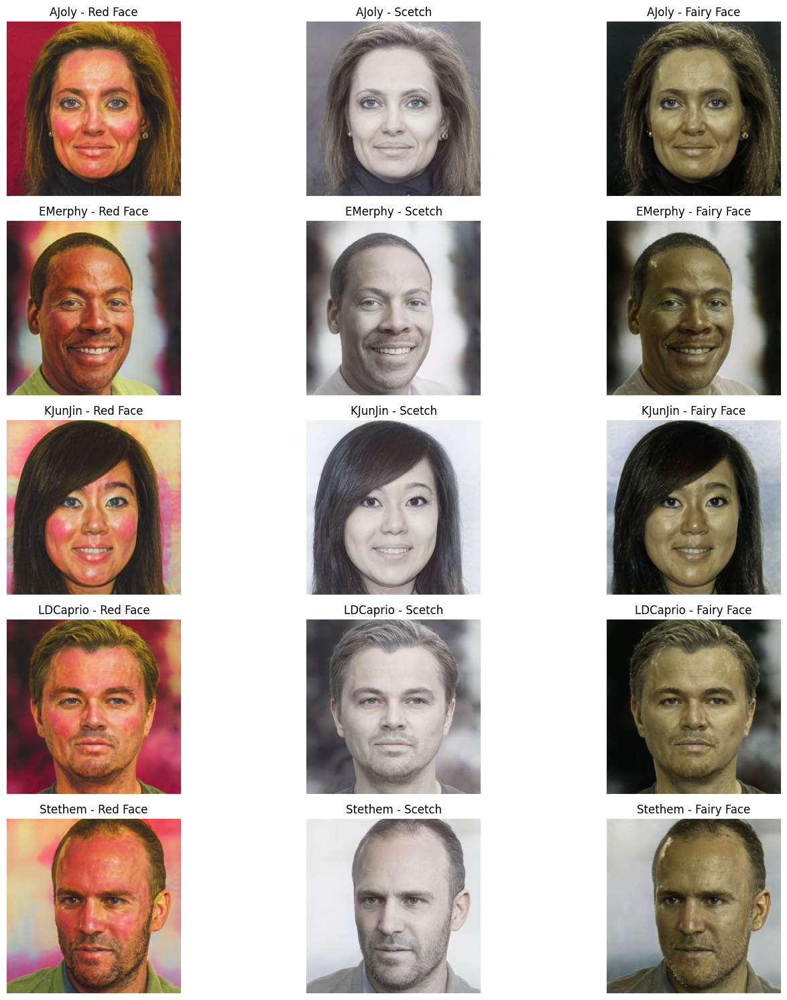

In [ ]:
styles_path = "/content/editing"
aligned_images_path = "/content/aligned_images"
invertion_path = "/content/e4e_invertion"
styles = ["red_face.jpg", "scetch.jpg", "fairy_face.jpg"]
change_indices = [9, 10, 11, 12, 13, 14, 15, 16, 17]

# Создание DataFrame для результатов
results = []

# Перебор всех людей и их изображений
for person in sorted(os.listdir(aligned_images_path)):
    person_images = os.path.join(aligned_images_path, person)
    if os.path.isdir(person_images):
        first_image = sorted(os.listdir(person_images))[0]
        first_image_path = os.path.join(person_images, first_image)

        row = [person]
        latent1 = torch.load(project_and_save_image(first_image_path)).to(device)

        for style in styles:
            style_path = os.path.join(styles_path, style)
            latent2 = torch.load(project_and_save_image(style_path)).to(device)
            latent2 = broadcast_w_sg(latent2)

            result = interpolate(latent1, latent2, psi=0.1, indeces=change_indices)
            result_image = result.detach().cpu().permute(0, 2, 3, 1).numpy()[0]
            row.append(result_image)

        results.append(row)

df = pd.DataFrame(results, columns=["Person", "Red Face", "Scetch", "Fairy Face"])

fig, axes = plt.subplots(len(df), len(df.columns) - 1, figsize=(15, 15))

for i, row in df.iterrows():
    for j, style in enumerate(df.columns[1:]):
        axes[i, j].imshow((row[style] * 127.5 + 128).astype(np.uint8))
        axes[i, j].set_title(f"{row['Person']} - {style}")
        axes[i, j].axis('off')

plt.tight_layout()
plt.show()

## Expression Transfer

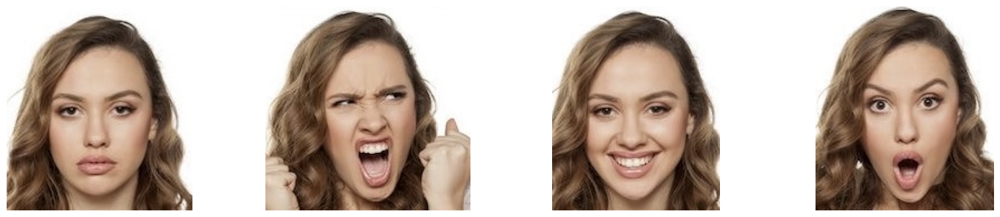

In [ ]:
# три эмоции и нейтральное выражение

import os
import matplotlib.pyplot as plt
from PIL import Image

images_folder = "/content/emotions"

images = []

for filename in sorted(os.listdir(images_folder)):
    filepath = os.path.join(images_folder, filename)
    if filename.endswith('.jpg'):
        image = Image.open(filepath)
        images.append(image)

fig, axes = plt.subplots(1, len(images), figsize=(20, 4))

for i, image in enumerate(images):
    axes[i].imshow(image)
    axes[i].axis('off')

plt.show()

In [ ]:
def interpolate_emotion(latent_pers, latent_neutral, latent_emoution, psi=0.5, indeces = [i for i in range(0,18)]):
    init_latent = latent_pers.clone()
    latent1 = latent_pers.clone()
    latent2 = latent_neutral.clone()
    latent3 = latent_emoution.clone()

    style = latent3 - latent2

    for i in indeces:
        latent1[:, i] += style[:, i] * psi

    edited_tensor = G.synthesis(latent1, noise_mode='const', force_fp32=True)
    init_tensor = G.synthesis(init_latent, noise_mode='const', force_fp32=True)
    style_tensor = G.synthesis(latent3, noise_mode='const', force_fp32=True)
    plot_image(torch.cat((init_tensor, style_tensor, edited_tensor ), dim=3), (10,10))
    return edited_tensor

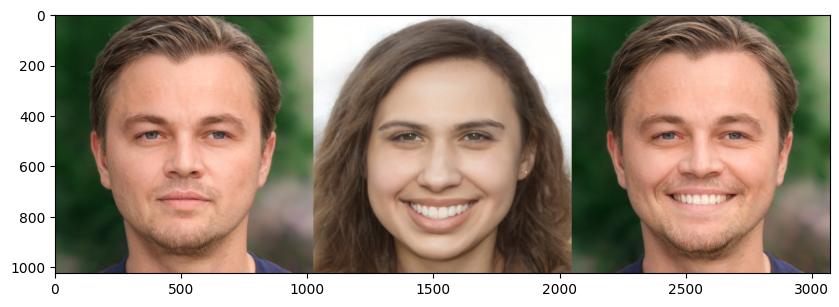

In [ ]:
picture = "/content/aligned_images/LDCaprio/0.jpg"
emotion = "/content/emotions/smile.jpg"
neutral = '/content/emotions/neutral.jpg'
indeces = [4, 5]

latent1=torch.load(project_and_save_image(picture)).to(device)

latent2=torch.load(project_and_save_image(neutral)).to(device)
# latent2 = broadcast_w_sg(latent2)

latent3=torch.load(project_and_save_image(emotion)).to(device)
# latent3 = broadcast_w_sg(latent3)

interpolate_emotion(latent1, latent2, latent3, psi=1, indeces = indeces)
print()

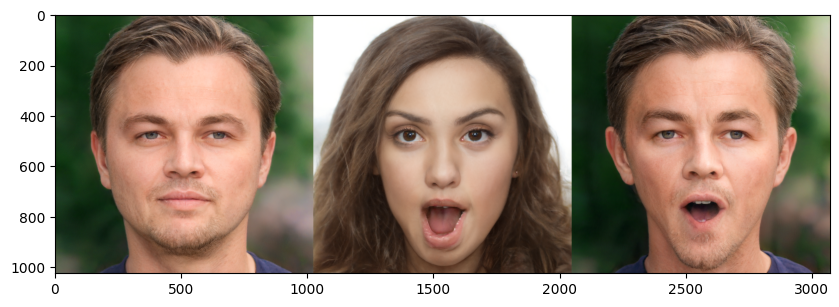

In [ ]:
picture = "/content/aligned_images/LDCaprio/0.jpg"
emotion = "/content/emotions/wtf.jpg"
neutral = '/content/emotions/neutral.jpg'
indeces = [3, 4, 8, 9]

latent1=torch.load(project_and_save_image(picture)).to(device)

latent2=torch.load(project_and_save_image(neutral)).to(device)
# latent2 = broadcast_w_sg(latent2)

latent3=torch.load(project_and_save_image(emotion)).to(device)
# latent3 = broadcast_w_sg(latent3)

interpolate_emotion(latent1, latent2, latent3, psi=1.3, indeces = indeces)
print()

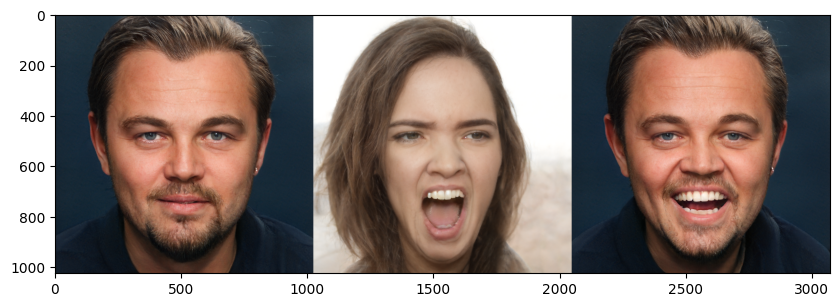

In [ ]:
picture = "/content/aligned_images/LDCaprio/1.jpg"
emotion = "/content/emotions/screem.jpg"
neutral = '/content/emotions/neutral.jpg'
indeces = [4,5]

latent1=torch.load(project_and_save_image(picture)).to(device)

latent2=torch.load(project_and_save_image(neutral)).to(device)
# latent2 = broadcast_w_sg(latent2)

latent3=torch.load(project_and_save_image(emotion)).to(device)
# latent3 = broadcast_w_sg(latent3)

interpolate_emotion(latent1, latent2, latent3, psi=1, indeces = indeces)
print()

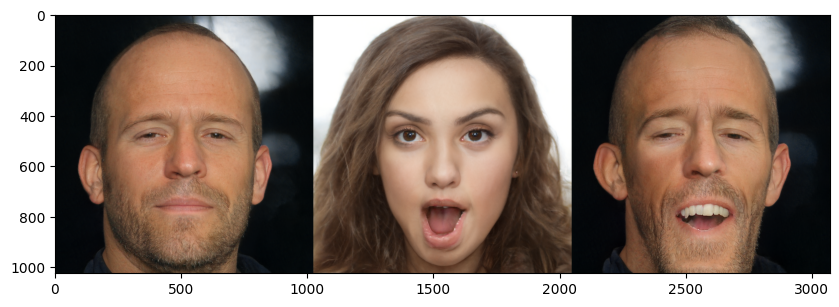

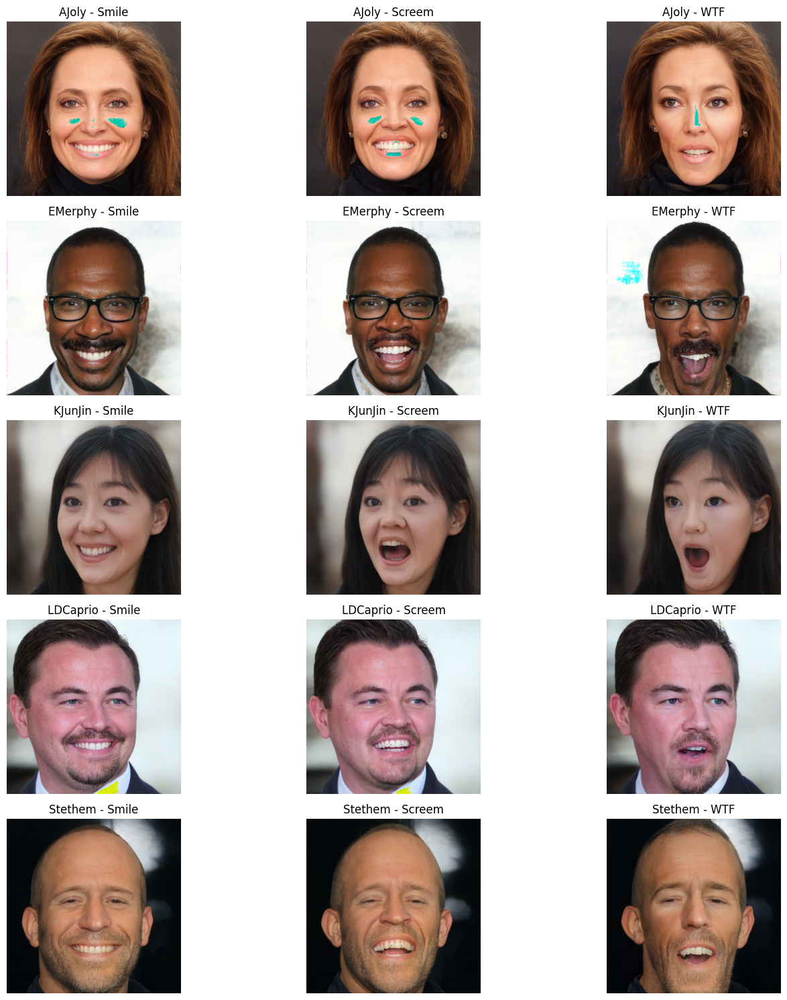

In [ ]:
aligned_images_path = "/content/aligned_images"
invertion_path = "/content/e4e_invertion"
neutral = '/content/emotions/neutral.jpg'
emotions_path = '/content/emotions'
styles = ["smile.jpg", "screem.jpg", "wtf.jpg"]

# Создание DataFrame для результатов
results = []

latent_neutral = torch.load(project_and_save_image(neutral)).to(device)

# Перебор всех людей и их изображений
for person in sorted(os.listdir(aligned_images_path)):
    person_images = os.path.join(aligned_images_path, person)
    if os.path.isdir(person_images):
        first_image = sorted(os.listdir(person_images))[0]
        first_image_path = os.path.join(person_images, first_image)

        row = [person]
        latent1 = torch.load(project_and_save_image(first_image_path)).to(device)

        for style in styles:
            style_path = os.path.join(emotions_path, style)
            latent2 = torch.load(project_and_save_image(style_path)).to(device)
            latent2 = broadcast_w_sg(latent2)

            if style == 'smile.jpg' or style == 'screem.jpg':
              result = interpolate_emotion(latent1, latent_neutral, latent2, psi=1, indeces = [4,5])
              result_image = result.detach().cpu().permute(0, 2, 3, 1).numpy()[0]
              row.append(result_image)
            elif style == 'wtf.jpg':
              result = interpolate_emotion(latent1, latent_neutral, latent2, psi=1.3, indeces = [3,4,8,9])
              result_image = result.detach().cpu().permute(0, 2, 3, 1).numpy()[0]
              row.append(result_image)

        results.append(row)

df = pd.DataFrame(results, columns=["Person", "Smile", "Screem", "WTF"])

fig, axes = plt.subplots(len(df), len(df.columns) - 1, figsize=(15, 15))

for i, row in df.iterrows():
    for j, style in enumerate(df.columns[1:]):
        axes[i, j].imshow((row[style] * 127.5 + 128).astype(np.uint8))
        axes[i, j].set_title(f"{row['Person']} - {style}")
        axes[i, j].axis('off')

plt.tight_layout()
plt.show()

## Face Swap

In [ ]:
!gdown --id 1QIPdkYyIwqEUS8jBNouWo9eYzr3DwDd5 -O /content/stylegan2-ada-pytorch/pretrained_models/ms1mv3_arcface_r50_fp16.pth


In [ ]:
# добавление нового лосса

import PIL
import os
import numpy as np
import torch
import lpips
import torch.nn as nn
import torchvision.transforms as transforms
from pytorch_msssim import ms_ssim
from stylegan2_models.arcface_model import get_model
import torch.nn.functional as F
from stylegan2_models.e4e.model_utils import load_e4e_standalone
import torchvision.transforms as transforms


def image2tensor_norm(image):
    transform = transforms.Compose([transforms.ToTensor(),
                                   transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    tensor = transform(image)
    return tensor



class Arcface_Loss(nn.Module):
    def __init__(self, weights_path, device):
        super().__init__()

        self.arcnet = get_model("r50", fp16=False)
        self.arcnet.load_state_dict(torch.load(weights_path))
        self.arcnet.eval()
        self.arcnet.to(device)

        self.cosin_loss = nn.CosineSimilarity(dim=1, eps=1e-6)

    def forward(self, source, synth):

        source = F.interpolate(source,size=(112,112), mode='bicubic')
        synth = F.interpolate(synth,size=(112,112), mode='bicubic')

        emb1 = self.arcnet(source)
        emb2 = self.arcnet(synth)
        loss = (1 - self.cosin_loss(emb1, emb2))[0]
        return loss

arcface_path = "//content/stylegan2-ada-pytorch/pretrained_models/ms1mv3_arcface_r50_fp16.pth"
attr_path  = "/content/aligned_images/Stethem/0.jpg"
id_path = "/content/aligned_images/AJoly/0.jpg"

In [ ]:
# добавлен новый лосс, начальная точка - проекция модели e4e

def get_face_swap(image_path, face_path, G, device, num_steps=150, initial_learning_rate=0.05, w_avg_samples=10000,
                          regularize_noise_weight=5e5, rec_weight=0.5, lpips_weight=1, face_weight = 1):
    # Загружаем изображение
    target_pil = Image.open(image_path).convert('RGB')
    target_tensor = image2tensor_norm(target_pil).to(device).unsqueeze(0)

    face_pil = Image.open(face_path).convert('RGB')
    face_tensor = image2tensor_norm(face_pil).to(device).unsqueeze(0)

    target_uint8 = np.array(target_pil, dtype=np.uint8)

    e4e_tensor = image2e4etensor(target_uint8).to(device).unsqueeze(0)
    initial_latent_vector = e4e_model(e4e_tensor)
    initial_latent_vector = nn.Parameter(initial_latent_vector, requires_grad=True)

    # Инициализируем функции потерь
    lpips_loss = Lpips_loss(device)
    rec_loss = Rec_loss()
    arcface_loss = Arcface_Loss(arcface_path, device)
    noise_bufs = {name: buf for (name, buf) in G.synthesis.named_buffers() if 'noise_const' in name}
    reg_loss = Reg_loss(noise_bufs)

    seed = 42

    optimizer = torch.optim.Adam([initial_latent_vector], lr=initial_learning_rate)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=50, gamma=0.1)  # Reduce LR every 50 steps

    for step in tqdm(range(num_steps)):
        synth_tensor = synth_tensor = G.synthesis(initial_latent_vector, noise_mode='const')

        lpips_value = lpips_loss(synth_tensor, target_tensor)
        rec_value = rec_loss(synth_tensor, target_tensor)
        arcface_value = arcface_loss(face_tensor, synth_tensor)
        reg_value = reg_loss()

        loss = lpips_value * lpips_weight + \
              rec_value * rec_weight + \
              arcface_value * face_weight + \
              reg_value * regularize_noise_weight

        optimizer.zero_grad(set_to_none=True)
        loss.backward()
        optimizer.step()
        scheduler.step()

    generated_tensor = G.synthesis(broadcast_w_sg(initial_latent_vector), noise_mode='const', force_fp32=True)

    return loss.item(), generated_tensor

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 150/150 [01:41<00:00,  1.48it/s]


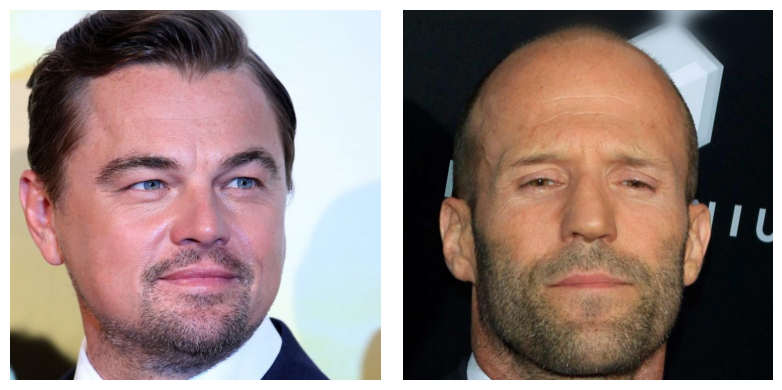

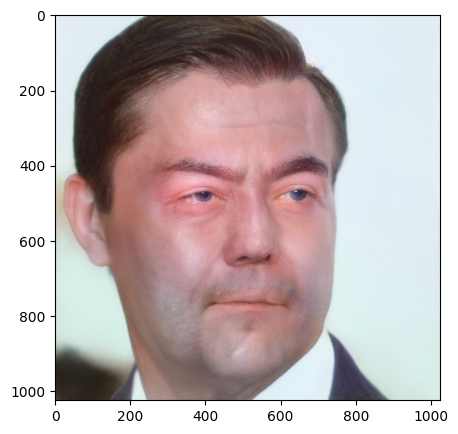

In [ ]:
image_path = '/content/aligned_images/LDCaprio/0.jpg'
face_path = '/content/aligned_images/Stethem/0.jpg'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

_, latent_projection = get_face_swap(image_path, face_path, G, device,\
                                     regularize_noise_weight=5e5, \
                                     rec_weight=0.7, \
                                     lpips_weight=0.5, \
                                     face_weight = 1.1)

image1 = Image.open(image_path)
image2 = Image.open(face_path)
fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(image1)
axes[0].axis('off')
axes[1].imshow(image2)
axes[1].axis('off')
plt.tight_layout()
plt.show()

plot_image(latent_projection, plot_size=(5,5))

In [ ]:
folders = [
    "/content/aligned_images/EMerphy",
    "/content/aligned_images/KJunJin",
    "/content/aligned_images/LDCaprio",
    "/content/aligned_images/Stethem"
]

image_paths = [os.path.join(folder, os.listdir(folder)[0]) for folder in folders]
results = {person: {} for person in image_paths}

# Генерация результатов face swap для каждой пары изображений
for i, image_path1 in enumerate(image_paths):
    for j, image_path2 in enumerate(image_paths):
        if i != j:  # Пропуск, если это одно и то же изображение
            _, latent_projection = get_face_swap(image_path1, image_path2, G, device,
                                                 regularize_noise_weight=5e5,
                                                 rec_weight=0.7,
                                                 lpips_weight=0.5,
                                                 face_weight=1.1)

            results[image_path1][image_path2] = latent_projection

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 150/150 [01:40<00:00,  1.49it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 150/150 [01:43<00:00,  1.45it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 150/150 [01:44<00:00,  1.43it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 150/150 [01:44<00:00,  1.43it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 150/150 [01:45<00:00,  1.43it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 150/150 [01:45<00:00,  1.43it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 150/150 [01:44<00:00,  1.43it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 150/150 [01:44<00:00,  1.43it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 150/150 [01:44<00:00,  1.43it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 150/150 [01:44<00:00,  1.44it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 150/150 [01:43<00:00,  1.44it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 150/150 [01:44<00:00,  1.44it/s]


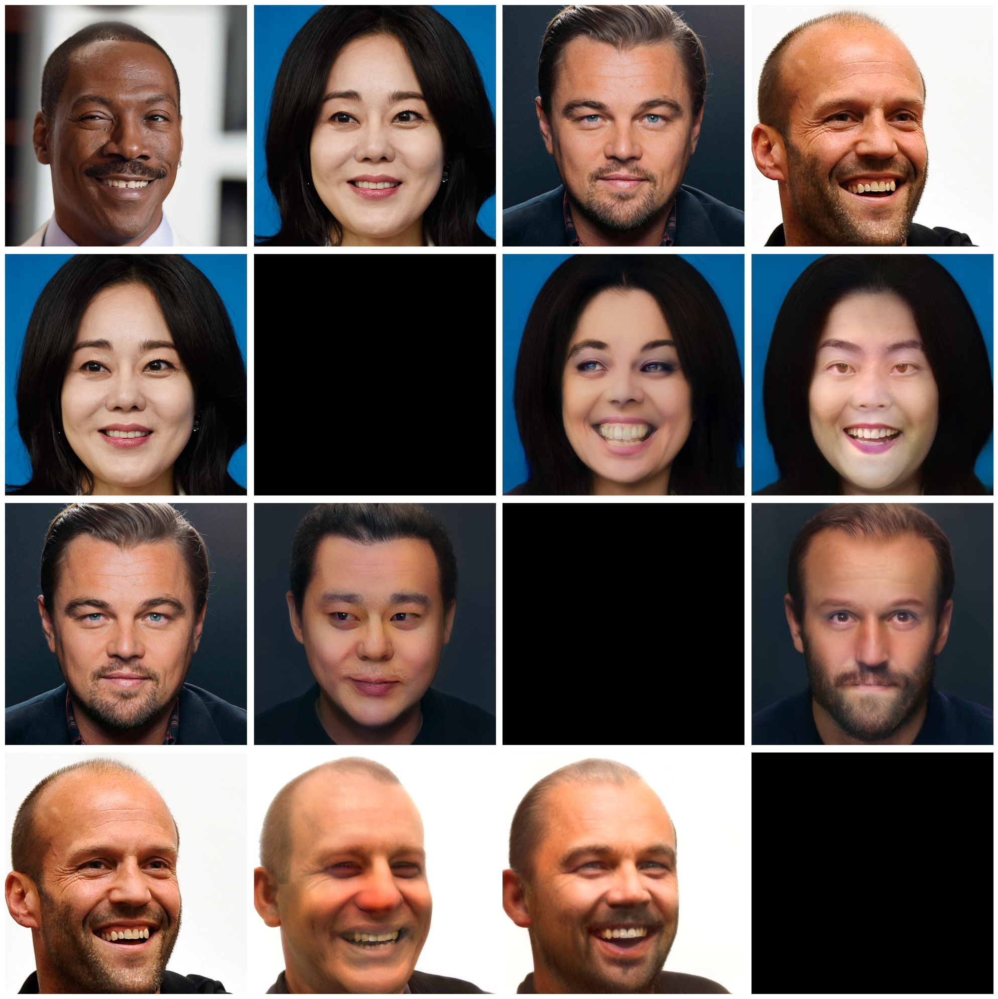

In [ ]:
# Отображение таблицы с результатами
fig, axes = plt.subplots(len(image_paths), len(image_paths), figsize=(20, 20))

for i, image_path1 in enumerate(image_paths):
    for j, image_path2 in enumerate(image_paths):
        if i == j:
            axes[i, j].imshow(np.zeros((256, 256, 3), dtype=np.uint8))  # Пустое место для диагонали
        elif image_path2 in results[image_path1]:
            tensor = results[image_path1][image_path2]
            tensor = (tensor.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
            result_image = Image.fromarray(tensor[0].cpu().numpy(), 'RGB')
            axes[i, j].imshow(result_image)
        else:
            axes[i, j].imshow(np.zeros((256, 256, 3), dtype=np.uint8))  # Пустое место

        axes[i, j].axis('off')

        if j == 0:
            # Исходное изображение для строки
            original_image1 = Image.open(image_path1).convert('RGB')
            axes[i, j].imshow(original_image1)
        if i == 0:
            # Исходное изображение для столбца
            original_image2 = Image.open(image_path2).convert('RGB')
            axes[i, j].imshow(original_image2)

plt.tight_layout()
plt.show()